## Training Model to Detect Pets

### It can Detect the following pets:
1. Dogs
2. Cats
3. Rabbits
4. Lizards
5. Fish
6. Birds
7. Snake
8. Tortoise


In [ ]:
#hide
!pip install -Uqq fastbook
import fastbook
fastbook.setup_book()

     |████████████████████████████████| 727kB 8.2MB/s 
     |████████████████████████████████| 1.0MB 23.3MB/s 
     |████████████████████████████████| 51kB 7.9MB/s 
     |████████████████████████████████| 51kB 7.0MB/s 
     |████████████████████████████████| 358kB 42.1MB/s 
     |████████████████████████████████| 92kB 11.1MB/s 
     |████████████████████████████████| 40kB 6.1MB/s 
     |████████████████████████████████| 40kB 5.4MB/s 
     |████████████████████████████████| 51kB 6.9MB/s 
     |████████████████████████████████| 61kB 8.3MB/s 
     |████████████████████████████████| 2.6MB 44.7MB/s 
Mounted at /content/gdrive


In [ ]:
#hide
from fastbook import *
from fastai.vision.widgets import *

In [ ]:
key = os.environ.get('AZURE_SEARCH_KEY', '4345648c7b644031a9ebc7ad461737c3')

In [ ]:
results = search_images_bing(key, 'pet cat')
ims = results.attrgot('content_url')
len(ims)

150

In [ ]:
doc(search_images_bing)

In [ ]:
class_types = 'dog','cat','rabbit','lizard','fish','snake','tortoise','bird'
path = Path('Pets 2')
len(class_types)

8

In [17]:
if not path.exists():
    path.mkdir()
    for o in class_types:
        dest = (path/o)
        dest.mkdir(exist_ok=True)
        results = search_images_bing(key, f'Pet {o}')
        download_images(dest, urls=results.attrgot('content_url'))

In [19]:
fns = get_image_files(path)
fns
len(fns)

1182

In [20]:
failed = verify_images(fns)
len(failed)

31

In [ ]:
failed.map(Path.unlink);

In [24]:
fns = get_image_files(path)
fns
len(fns)

1151

In [25]:
failed = verify_images(fns)
len(failed)

0

In [26]:
pets = DataBlock(
    blocks=(ImageBlock, CategoryBlock), 
    get_items=get_image_files, 
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=parent_label,
    item_tfms=Resize(128))

In [27]:
dls = pets.dataloaders(path)

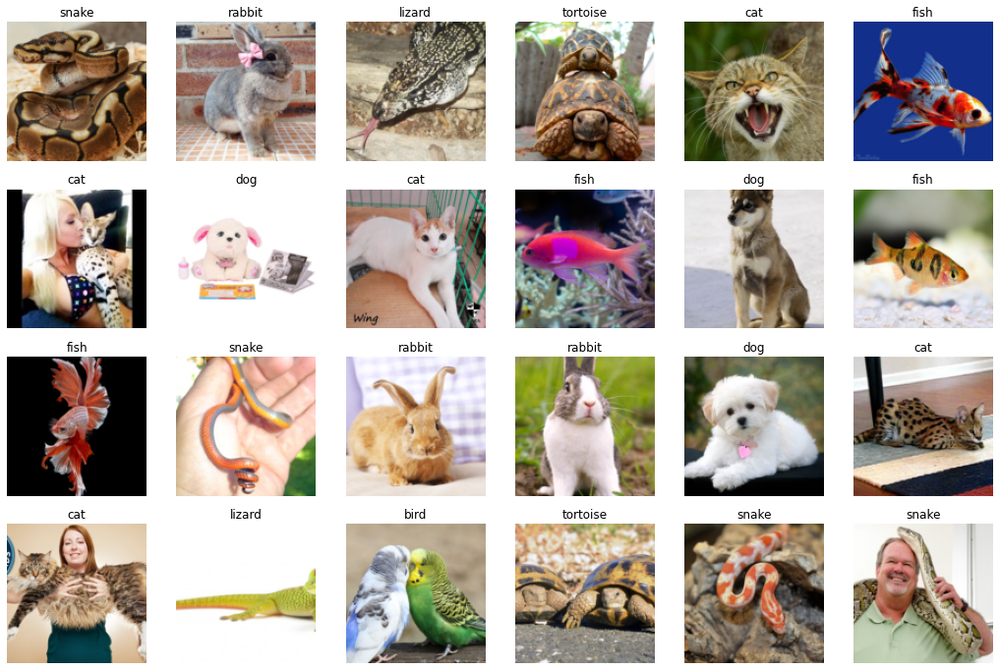

In [28]:
dls.valid.show_batch(max_n=24, nrows=4)

In [34]:
learn = cnn_learner(dls, resnet34, metrics=error_rate)
learn.fine_tune(6)

epoch,train_loss,valid_loss,error_rate,time
0,2.183455,0.479877,0.165217,00:30


epoch,train_loss,valid_loss,error_rate,time
0,0.600546,0.319615,0.130435,00:31
1,0.440316,0.237954,0.104348,00:32
2,0.312828,0.228882,0.091304,00:31
3,0.232408,0.195773,0.082609,00:32
4,0.170717,0.194418,0.078261,00:31
5,0.132134,0.204077,0.082609,00:31


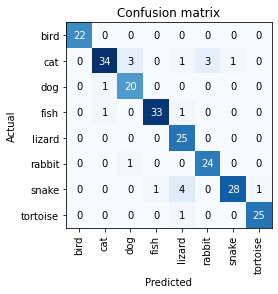

In [35]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

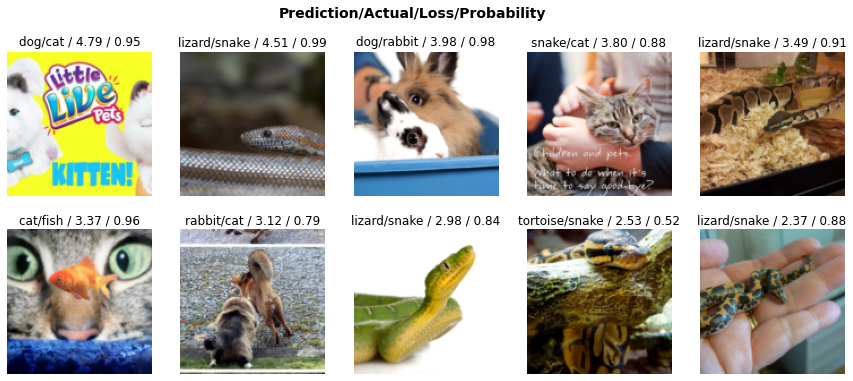

In [31]:
interp.plot_top_losses(10, nrows=2)

In [32]:
#hide_output
cleaner = ImageClassifierCleaner(learn)
cleaner

In [33]:
#hide
for idx in cleaner.delete(): cleaner.fns[idx].unlink()
for idx,cat in cleaner.change(): shutil.move(str(cleaner.fns[idx]), path/cat)

In [36]:
learn.export('pets.pkl')